In [2]:
from typing import List, Dict
import pandas as pd
from pathlib import Path
from pandas import DataFrame
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(15,8)})

In [3]:
data_path = Path("../data/nemea_results__20210222/sizes")

def load_table(path: Path) -> DataFrame:
    all_entries: List[List[str]] = []
    av_dict_entries: List[List[int]] = []
    column_names: List[str] = []
    types: List[str] = []
    with path.open() as file:
        table_starts: bool = False
        for line in file:
            if not table_starts and "attribute_vector_size" in line:
                e = [entry for entry in line.split(",") if entry != "" and entry != "\n"]
                av_dict_entries.append([int(e[1]), int(e[3])])
            if len(column_names) != 0 and table_starts and not '|' in line:
                break
            if not '|' in line:
                continue
            if len(column_names) == 0:
                column_names = [entry.replace(" ", "")
                                for entry in line.split("|") if entry != "" and entry != "\n"]
                continue
            if len(types) == 0:
                types =  [entry.replace(" ", "")
                          for entry in line.split("|") if entry != "" and entry != "\n"]
                continue
            if "<ValueS>" in line:
                table_starts = True
                continue
            if not table_starts:
                continue
            new_entry: List[str] = [entry.replace(" ", "")
                                    for entry in line.split("|") if entry != "" and entry != "\n"]
            all_entries.append(new_entry)
    as_type: Dict[str, str] = {column_names[i]:types[i] for i in range(0, len(column_names))}

    entries = [a + b for a,b, in zip(all_entries, av_dict_entries)]
    column_names = column_names + ["attribute_vector_size", "dict_size"]
    df = DataFrame(data=entries, columns=column_names).astype(as_type)

    df["duplication_factor"] = df["attribute_vector_size"] / df["dict_size"]

    df = df.astype({'duplication_factor': 'int32'})

    return df

default_filename = "sizes_dictionary.txt"
default = load_table(data_path / default_filename)

grouped_by_column = default.groupby(["table_name", "column_name", "column_data_type"], as_index=False)["size_in_bytes"].sum()
columns_per_data_type = grouped_by_column.groupby(["column_data_type"], as_index=False)["column_name"].count()
size_per_data_type = grouped_by_column.groupby(["column_data_type"], as_index=False)["size_in_bytes"].sum()
print("number of columns per datatype")
print(columns_per_data_type)

default

number of columns per datatype
  column_data_type  column_name
0            float            9
1              int           19
2           string           33


,table_name,chunk_id,column_id,column_name,column_data_type,distinct_value_count,encoding_type,vector_compression_type,size_in_bytes,point_accesses,sequential_accesses,monotonic_accesses,random_accesses,dictionary_accesses,attribute_vector_size,dict_size,duplication_factor
0,nation,0,0,n_nationkey,int,25,Dictionary,FixedSize1ByteAligned,221,312,5075,2210,784,7597,25,25,1
1,nation,0,1,n_name,string,25,Dictionary,FixedSize1ByteAligned,1153,0,12725,0,98920778,40041823,25,25,1
2,nation,0,2,n_regionkey,int,5,Dictionary,FixedSize1ByteAligned,141,0,8050,0,0,8050,25,5,5
3,nation,0,3,n_comment,string,25,Dictionary,FixedSize1ByteAligned,3035,0,25,0,0,25,25,25,1
4,part,0,0,p_partkey,int,65535,Dictionary,FixedSize2ByteAligned,393306,0,6619035,2070493,261918,8689528,65535,65535,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17811,customer,22,6,c_mktsegment,string,5,Dictionary,FixedSize1ByteAligned,58558,0,2795040,0,0,58465,58230,5,11646
17812,customer,22,7,c_comment,string,58226,Dictionary,FixedSize2ByteAligned,6711930,0,58230,0,500633,58230,58230,58226,1
17813,region,0,0,r_regionkey,int,5,Dictionary,FixedSize1ByteAligned,121,321,5,0,0,326,5,5,1
17814,region,0,1,r_name,string,5,Dictionary,FixedSize1ByteAligned,333,0,1610,0,0,1610,5,5,1


In [4]:
def compute_sizes(df):
    total_size = df["size_in_bytes"].sum()

    int_col_size = df[df["column_data_type"].str.match("int")]["size_in_bytes"].sum()
    float_col_size = df[df["column_data_type"].str.match("float")]["size_in_bytes"].sum()
    string_col_size = df[df["column_data_type"].str.match("string")]["size_in_bytes"].sum()

    return (total_size, int_col_size, float_col_size, string_col_size)

(default_size, default_int_col_size, default_float_col_size, default_string_col_size) = compute_sizes(default)
print("default dict size ", default_size)
print("default dict int col size ", default_int_col_size)
print("default int col portion of size ", default_int_col_size / default_size)

def fancy_codec_name(f):
    return f.replace("sizes_", "").replace(".txt", "")

names = []
total_sizes = []
int_col_sizes = []
float_col_sizes = []
string_col_sizes = []
directory = os.fsencode(data_path)
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".txt"):
        df = load_table(data_path / filename)
        names.append(filename)
        (total_size, int_col_size, float_col_size, string_col_size) = compute_sizes(df)
        total_sizes.append(total_size)
        int_col_sizes.append(int_col_size)
        float_col_sizes.append(float_col_size)
        string_col_sizes.append(string_col_size)

df = pd.DataFrame(data={'filename': names, 'total_size': total_sizes, 'int_col_sizes': int_col_sizes, 'float_col_sizes': float_col_sizes, 'string_col_sizes': string_col_sizes})
df["codec"] = [fancy_codec_name(f) for f in df["filename"]]
df = df.sort_values("codec")
df

default dict size  9999839546
default dict int col size  1372782099
default int col portion of size  0.13728041261913265


,filename,total_size,int_col_sizes,float_col_sizes,string_col_sizes,codec
0,sizes_bitpacking_compactvector.txt,9868210083,1445245248,664533612,7758431223,bitpacking_compactvector
1,sizes_bitpacking_turbopfor.txt,9713373626,1355351562,634173721,7723848343,bitpacking_turbopfor
3,sizes_bitpacking_turbopfor_seq.txt,9713373626,1355351562,634173721,7723848343,bitpacking_turbopfor_seq
4,sizes_dictionary.txt,9999839546,1372782099,676386560,7950670887,dictionary
2,sizes_fsba.txt,9999839546,1372782099,676386560,7950670887,fsba
5,sizes_simdbp.txt,9552397107,1307080816,602595564,7642720727,simdbp


<AxesSubplot:xlabel='Library/Codec', ylabel='total_size Footprint TPCH SF10 in GB'>

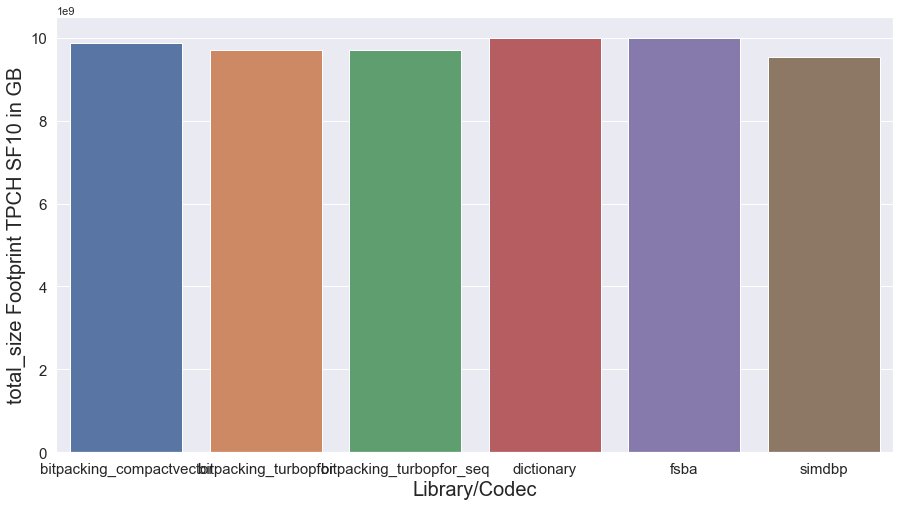

In [5]:
# https://stackoverflow.com/questions/28904397/how-to-set-the-value-of-the-axis-multiplier-in-matplotlib
class MagnitudeFormatter(matplotlib.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

def plot(d, col, filename, plot=None):
    plt.tight_layout()
    if plot is None:
        plot = sns.barplot(data=d, x="codec", y=col)
    #plot.set(ylim=(1.5 * 10**9, 2.05 * 10**9))
    plot.set_xlabel("Library/Codec",fontsize=20)
    plot.set_ylabel(col + " Footprint TPCH SF10 in GB",fontsize=20) 
    plot.tick_params(labelsize=15)
    plot.yaxis.set_major_formatter(MagnitudeFormatter(9))
    #plot.ticklabel_format(axis="y", style="sci", scilimits=())
    sns.set(rc={'figure.figsize':(20,10)})
    plt.savefig(f"visualizations/{filename}.svg", format="svg")
    return plot

plot(df, "total_size", "tpch_compression_total_sizes")

<AxesSubplot:xlabel='Library/Codec', ylabel='int_col_sizes Footprint TPCH SF10 in GB'>

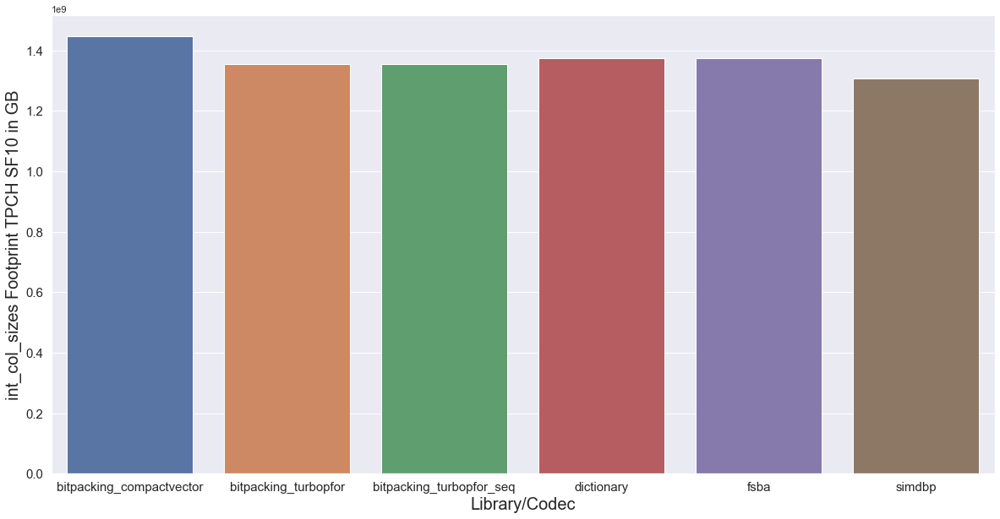

In [6]:
plot(df, "int_col_sizes", "tpch_compression_int_col_sizes")

<AxesSubplot:xlabel='Library/Codec', ylabel='float_col_sizes Footprint TPCH SF10 in GB'>

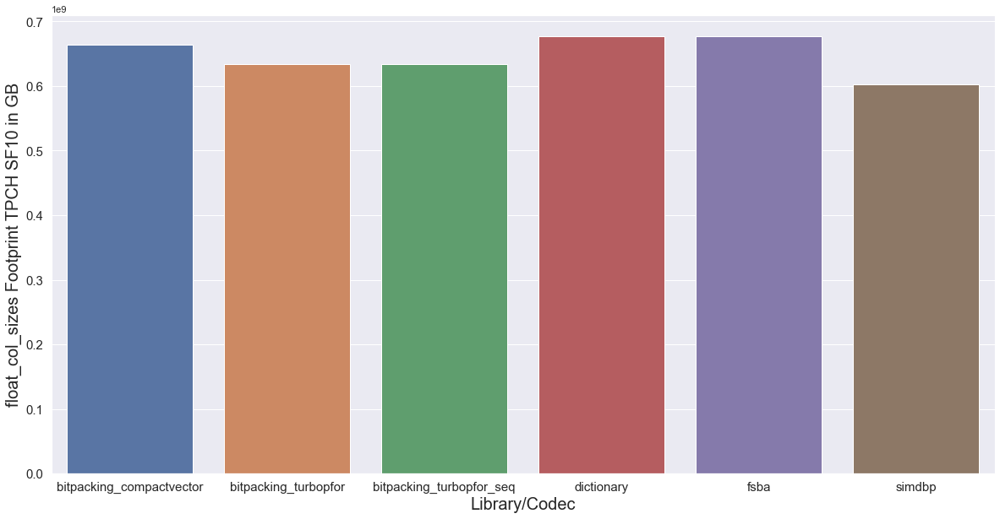

In [7]:
plot(df, "float_col_sizes", "tpch_compression_float_col_sizes")

<AxesSubplot:xlabel='Library/Codec', ylabel='string_col_sizes Footprint TPCH SF10 in GB'>

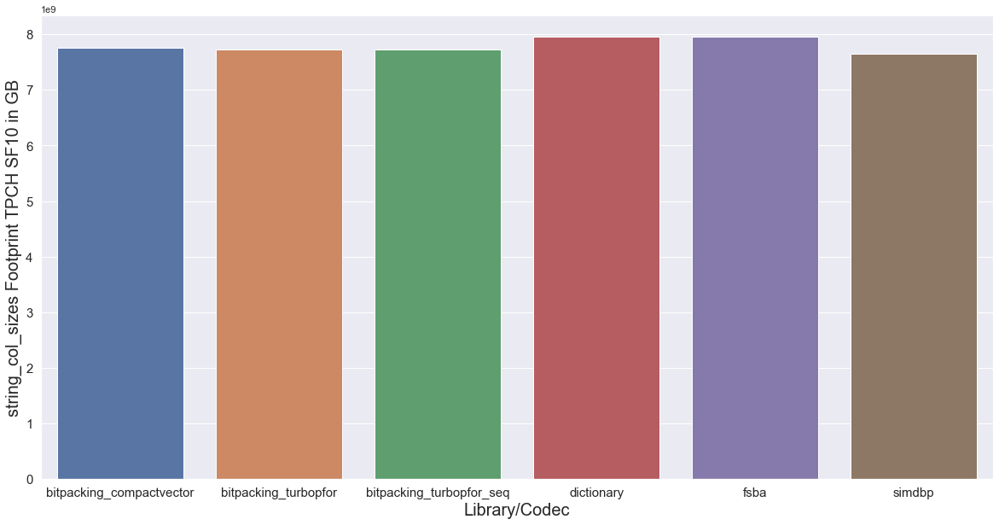

In [8]:
plot(df, "string_col_sizes", "tpch_compression_string_col_sizes")

## the compression savings depend on the column characteristics. Let's examine them further and consider columns with a big AV and small dict (lots of duplication)

<AxesSubplot:ylabel='Frequency'>

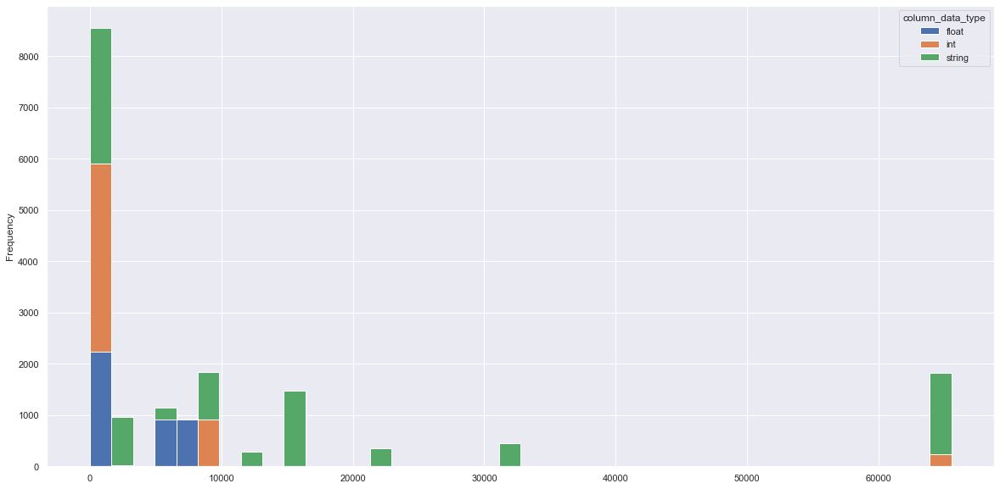

In [9]:
df_plot = default.groupby(['duplication_factor', 'column_data_type']).size().reset_index().pivot(columns='column_data_type', index='duplication_factor', values=0)
d = pd.DataFrame()
d["duplication_factor"] = default["duplication_factor"]
d["column_data_type"] = default["column_data_type"]
d.pivot(columns="column_data_type").duplication_factor.plot.hist(stacked=True, bins=40)

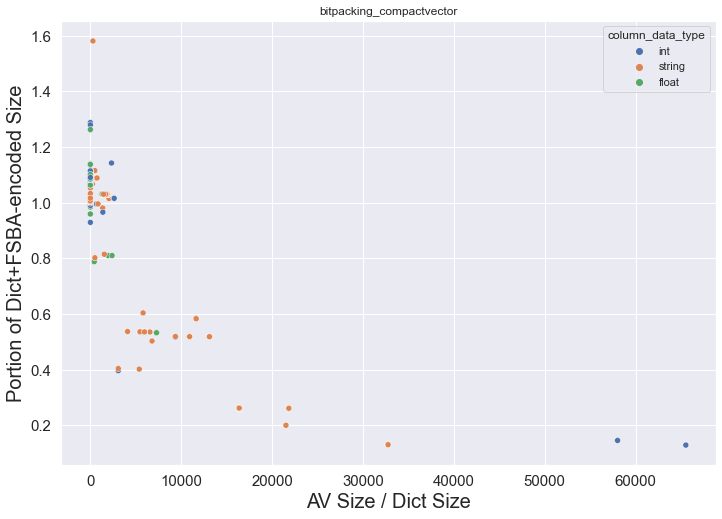

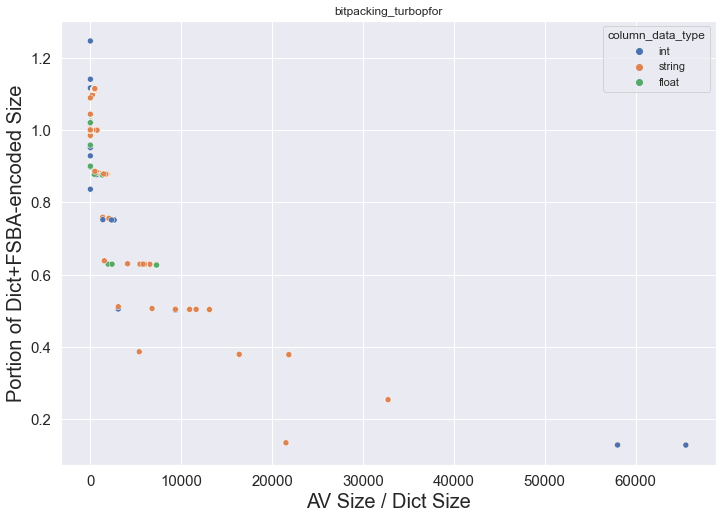

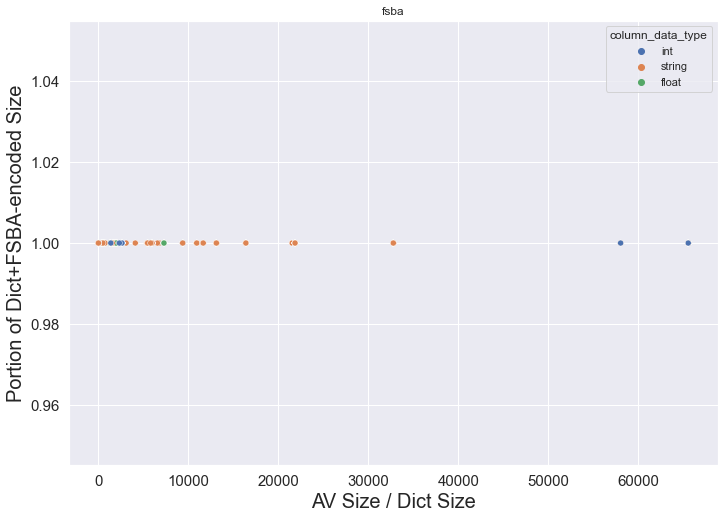

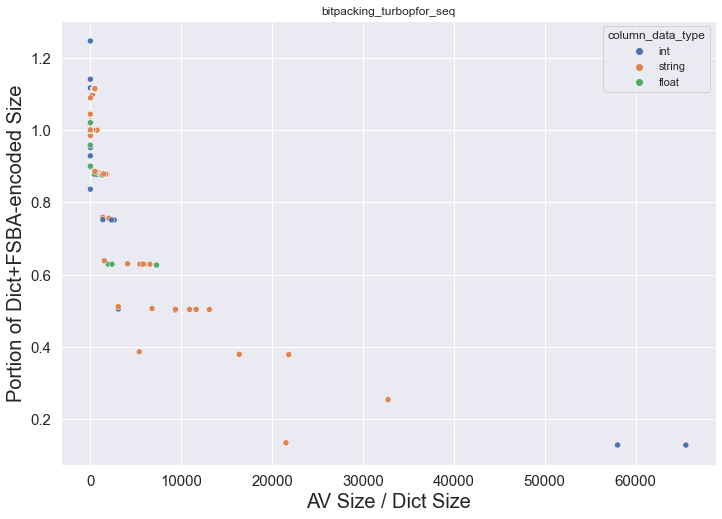

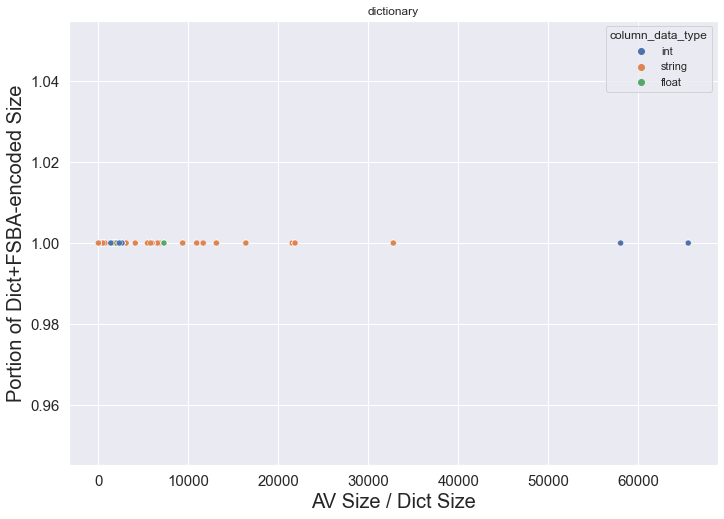

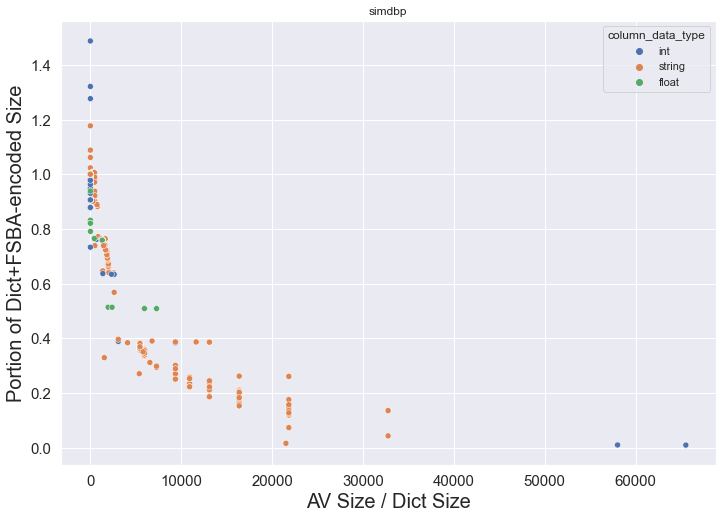

In [10]:
directory = os.fsencode(data_path)
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".txt"):

        df = load_table(data_path / filename)
        df["ratio_of_default_footprint"] = df["size_in_bytes"] / default["size_in_bytes"]
        sns.set(rc={'figure.figsize':(10,7)})

        plot = sns.scatterplot(data=df, x="duplication_factor", y="ratio_of_default_footprint", hue="column_data_type")
        plt.tight_layout()
        plot.set_xlabel("AV Size / Dict Size",fontsize=20)
        plot.set_ylabel("Portion of Dict+FSBA-encoded Size",fontsize=20) 
        plot.tick_params(labelsize=15)
        plot.set_title(fancy_codec_name(filename))
        plt.savefig(f"visualizations/duplication_savings_{fancy_codec_name(filename)}.svg", format="svg")
        plt.show()

In [ ]:
### now some columns in detail: lineitem - l_discount has heavy optimization potential because of the high duplication. In comparison to FSBA, most schemes only need half the amount of memory. TPC-H Query 6 heavily scans this column. While we do not notice any impact during single-threaded execution, during multithreaded execution where the memory bandwidth is actually used to its limits, we see significant improvements with the schemes that compress better. Have a look at the CompareTPCHMultithreaded_ColumnCompression notebook.

In [17]:
directory = os.fsencode(data_path)
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".txt"):

        df = load_table(data_path / filename)
        df["ratio_of_default_footprint"] = df["size_in_bytes"] / default["size_in_bytes"]
        sns.set(rc={'figure.figsize':(10,7)})

        discount = df[df["table_name"] == "lineitem"]
        discount = discount[discount["column_name"] == "l_discount"]
        print(filename, "\n\tduplication factor", discount["duplication_factor"].mean(), "ratio_of_default_footprint", discount["ratio_of_default_footprint"].mean())
        
        

sizes_bitpacking_compactvector.txt 
	duplication factor 5952.633187772925 ratio_of_default_footprint 0.5325604258994455
sizes_bitpacking_turbopfor.txt 
	duplication factor 5952.633187772925 ratio_of_default_footprint 0.6262990293608958
sizes_fsba.txt 
	duplication factor 5952.633187772925 ratio_of_default_footprint 1.0
sizes_bitpacking_turbopfor_seq.txt 
	duplication factor 5952.633187772925 ratio_of_default_footprint 0.6262990293608958
sizes_dictionary.txt 
	duplication factor 5952.633187772925 ratio_of_default_footprint 1.0
sizes_simdbp.txt 
	duplication factor 5952.633187772925 ratio_of_default_footprint 0.508874790103831


In [ ]:
### lineitem - l_partkey has no optimization potential because of no duplication. In comparison to FSBA, most schemes need more memory. Exactly 16 bits are needed to represent this value. but aligned FSBA is more heavily optimized.

In [18]:
directory = os.fsencode(data_path)
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".txt"):

        df = load_table(data_path / filename)
        df["ratio_of_default_footprint"] = df["size_in_bytes"] / default["size_in_bytes"]
        sns.set(rc={'figure.figsize':(10,7)})

        discount = df[df["table_name"] == "lineitem"]
        discount = discount[discount["column_name"] == "l_partkey"]
        print(filename, "\n\tduplication factor", discount["duplication_factor"].mean(), "ratio_of_default_footprint", discount["ratio_of_default_footprint"].mean())
        
        

sizes_bitpacking_compactvector.txt 
	duplication factor 1.0 ratio_of_default_footprint 1.084423376998353
sizes_bitpacking_turbopfor.txt 
	duplication factor 1.0 ratio_of_default_footprint 1.0211154791377859
sizes_fsba.txt 
	duplication factor 1.0 ratio_of_default_footprint 1.0
sizes_bitpacking_turbopfor_seq.txt 
	duplication factor 1.0 ratio_of_default_footprint 1.0211154791377859
sizes_dictionary.txt 
	duplication factor 1.0 ratio_of_default_footprint 1.0
sizes_simdbp.txt 
	duplication factor 1.0 ratio_of_default_footprint 1.0013000517027175
